In [492]:
%matplotlib widget


In [493]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

project_root = "/home/tang584/scripts/linux_resource_detect/perf_analysis"

pattern_configs = {
    "pyflex":{
        "task_order_list" : f"{project_root}/pyflextrkr/pyflextrkr_s9_script_order.json",
        "csv_file_path" : f'{project_root}/fastflow_plots/summer_sam_4n_pfs_s9_tr_estimated_fixed.csv',
        "plot_file_name" : 'pyflex_3d_relationship_files.pdf',
        "file_group_patterns" : [
            "pr_rlut_.*\\.nc",
            "cloudid_.*\\.nc",
            "track_.*\\.nc",
            "tracknumbers_.*\\.nc",
            "trackstats_.*\\.nc",
            "trackstats_sparse_.*\\.nc",
            "mcs_tracks_.*\\.nc",
            "IMERG_landmask_.*\\.nc",
            "mcs_tracks_pf_.*\\.nc",
            "mcs_tracks_robust_.*\\.nc",
            "mcstrack_.*\\.nc",
            "mcs_tracks_final_.*\\.nc"
        ],
        "result_path": f"./pyflex_plots"
    }
}

# Define file grouping file_group_patterns



def shorten_task_name(name):
    parts = name.split("_")
    # print(f"Original parts: {parts}")
    shortened = [p[:10] for i, p in enumerate(parts) if i % 2 == 0 or i == len(parts) - 1]
    # print(f"Shortened: {shortened}")
    return "_".join(shortened)

In [494]:

# Read CSV file
# csv_file_path = '{project_root}/fastflow_plots/par_9000_1n_pfs_ps300_fixed.csv'
# plot_file_name = '9000_3d_relationship_files.pdf'

# csv_file_path = '{project_root}/fastflow_plots/summer_sam_4n_pfs_s9_tr_estimated.csv'
# plot_file_name = 'pyflex_3d_relationship_files.pdf'

CURR_WF = "pyflex" # pyflex, ddmd, 1kgenome

csv_file_path = pattern_configs[CURR_WF]["csv_file_path"]
plot_file_name = pattern_configs[CURR_WF]["plot_file_name"]
file_group_patterns = pattern_configs[CURR_WF]["file_group_patterns"]
task_order_file = pattern_configs[CURR_WF]["task_order_list"]
extension_grouping = pattern_configs[CURR_WF].get("extension_grouping", False)
result_path = pattern_configs[CURR_WF].get("result_path", "./result_plots")

df = pd.read_csv(csv_file_path)


In [495]:
df.size, df.shape, df.columns, df['operation'].unique()

# Replace with shortened task name in all taskName columns
short_taskName_dict = {
    "run_idfeature": "idfea",
    "run_tracksingle": "trksgl",
    "run_gettracks": "gettrks",
    "run_trackstats": "trksst",
    "run_identifymcs": "idmcs",
    "run_matchpf": "matchpf",
    "run_robustmcs": "robmcs",
    "run_mapfeature": "mapfea",
    "run_speed": "speed"
}

# Replace task names in the DataFrame
df['taskName'] = df['taskName'].replace(short_taskName_dict)
# Replace task names in the DataFrame
df['prevTask'] = df['prevTask'].replace(short_taskName_dict)

df.columns


Index(['operation', 'randomOffset', 'transferSize', 'aggregateFilesizeMB',
       'numTasks', 'parallelism', 'totalTime', 'numNodesList', 'numNodes',
       'tasksPerNode', 'trMiB', 'storageType', 'opCount', 'taskName',
       'taskPID', 'fileName', 'stageOrder', 'prevTask',
       'estimated_trMiB_ssd_p', 'estimated_trMiB_beegfs_p',
       'estimated_trMiB_ssd_1p', 'estimated_ts_slope_ssd_1p',
       'estimated_trMiB_ssd_12p', 'estimated_ts_slope_ssd_12p',
       'estimated_trMiB_beegfs_1p', 'estimated_ts_slope_beegfs_1p',
       'estimated_trMiB_beegfs_12p', 'estimated_ts_slope_beegfs_12p'],
      dtype='object')

In [496]:
# Analyze Dataframe Info:

# # of unique Stages
unique_stages = df['stageOrder'].unique()
# # of unique Tasks
unique_tasks = df['taskName'].unique()
# # Task instance count based on dominant I/O type
task_instance_counts = (
    df.groupby(['taskName', 'operation'])
    .size()
    .unstack(fill_value=0)
    .max(axis=1)
)

# If needed as a total count
total_task_instances = task_instance_counts.sum()

# # of I/O entries (rows in the DataFrame)
num_io_entries = df.shape[0]
# # of unique I/O files
unique_files = df['fileName'].unique()
# # average file resues: calculate the average number of times each file is reused for each unique file
avg_file_reuses = df.groupby('fileName').size().mean()
# Total I/O size
total_io_size = df['aggregateFilesizeMB'].sum()

# Print all the information
print("=========================================")
print(f"Number of unique stages: {len(unique_stages)}")
# print(f"Number of unique tasks: {len(unique_tasks)}")
print(f"Total task instances: {total_task_instances}")
print(f"Total I/O size (MB): {total_io_size:.2f}")
print(f"Total I/O size (GB): {total_io_size / 1024:.2f}")
# print(f"Number of I/O entries: {num_io_entries}")
print(f"Number of unique I/O files: {len(unique_files)}")
print(f"Average file reuses: {avg_file_reuses:.2f}")
print("=========================================")
# Print unique stages and tasks and File names
print(f"Unique stages: {unique_stages}")
print(f"Unique tasks: {unique_tasks}")
print(f"Unique file names: {unique_files}")


Number of unique stages: 9
Total task instances: 773
Total I/O size (MB): 11813.15
Total I/O size (GB): 11.54
Number of unique I/O files: 197
Average file reuses: 4.68
Unique stages: [1 2 3 4 5 6 7 8 9]
Unique tasks: ['idfea' 'trksgl' 'gettrks' 'trksst' 'idmcs' 'matchpf' 'robmcs' 'mapfea'
 'speed']
Unique file names: ['pr_rlut_mean_sam_2016080111.nc' 'cloudid_20160801_111500.nc'
 'cloudid_20160802_191500.nc' 'pr_rlut_mean_sam_2016080219.nc'
 'cloudid_20160801_231500.nc' 'pr_rlut_mean_sam_2016080123.nc'
 'cloudid_20160802_181500.nc' 'pr_rlut_mean_sam_2016080218.nc'
 'cloudid_20160802_151500.nc' 'pr_rlut_mean_sam_2016080215.nc'
 'cloudid_20160801_081500.nc' 'pr_rlut_mean_sam_2016080108.nc'
 'cloudid_20160802_061500.nc' 'pr_rlut_mean_sam_2016080206.nc'
 'pr_rlut_mean_sam_2016080116.nc' 'cloudid_20160801_161500.nc'
 'cloudid_20160801_041500.nc' 'pr_rlut_mean_sam_2016080104.nc'
 'cloudid_20160801_141500.nc' 'pr_rlut_mean_sam_2016080114.nc'
 'pr_rlut_mean_sam_2016080204.nc' 'cloudid_20160802

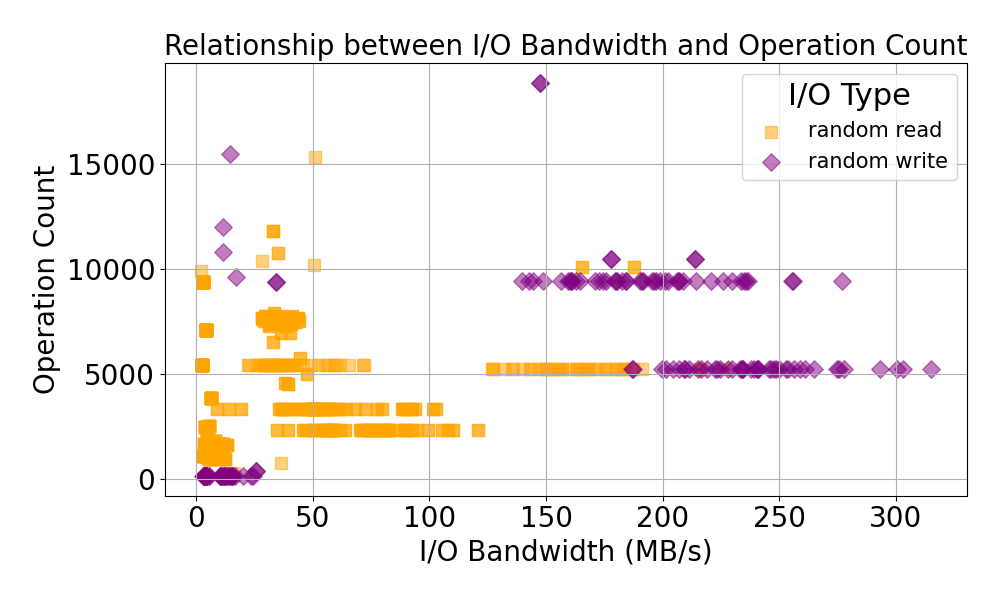

In [497]:
# # Add new columns for colors and labels based on the 'operation' column
# df['color'] = df['operation'].map({0: 'blue', 1: 'red'})
# df['label'] = df['operation'].map({0: 'write', 1: 'read'})
# df['marker'] = df['operation'].map({0: 'x', 1: 'o'})  # 'o' for circle, 's' for square

# # 2D plot: Relationship between aggregateFilesizeMB and totalTime
# plt.figure(figsize=(10, 6))

# for label in df['label'].unique():
#     subset = df[df['label'] == label]
#     marker = subset['marker'].iloc[0]
#     facecolor = 'none' if marker == 'o' else subset['color'].iloc[0]
#     plt.scatter(subset['trMiB'], subset['opCount'], 
#                 label=label, 
#                 edgecolor=subset['color'].iloc[0],  # Edge color for circle markers
#                 facecolors=facecolor,  # Only the circle markers will be hollow
#                 marker=marker,
#                 s=80,
#                 alpha=0.5)

# plt.title('Relationship between Transfer Size and Total Time')
# plt.xlabel('I/O Bandwidth (MB/s)')
# # plt.xlabel('Data size (MB)')
# plt.ylabel('Operation count')
# plt.grid(True)
# plt.legend(title="Operation")
# plt.show()

# Define mapping of operation and randomness to I/O type
def map_io_type(row):
    if row['operation'] == 0 and row['randomOffset'] == 0:
        return 'sequential write'
    elif row['operation'] == 0 and row['randomOffset'] == 1:
        return 'random write'
    elif row['operation'] == 1 and row['randomOffset'] == 0:
        return 'sequential read'
    elif row['operation'] == 1 and row['randomOffset'] == 1:
        return 'random read'
    else:
        return 'unknown'

# Apply the mapping
df['io_type'] = df.apply(map_io_type, axis=1)

# Assign colors and markers to each I/O type
io_color_map = {
    'sequential write': 'blue',
    'random write': 'purple',
    'sequential read': 'green',
    'random read': 'orange',
}
io_marker_map = {
    'sequential write': 'x',
    'random write': 'D',
    'sequential read': 'o',
    'random read': 's',
}

df['color'] = df['io_type'].map(io_color_map)
df['marker'] = df['io_type'].map(io_marker_map)

# 2D plot: Relationship between I/O Bandwidth and Operation Count
plt.figure(figsize=(10, 6))

for io_type in df['io_type'].unique():
    subset = df[df['io_type'] == io_type]
    marker = subset['marker'].iloc[0]
    facecolor = 'none' if marker == 'o' else subset['color'].iloc[0]
    plt.scatter(
        subset['trMiB'], 
        subset['opCount'], 
        label=io_type, 
        edgecolor=subset['color'].iloc[0], 
        facecolors=facecolor,
        marker=marker,
        s=80,
        alpha=0.5
    )

plt.title('Relationship between I/O Bandwidth and Operation Count')
plt.xlabel('I/O Bandwidth (MB/s)')
plt.ylabel('Operation Count')
plt.grid(True)
plt.legend(title="I/O Type")
plt.tight_layout()
plt.show()


/tmp/ipykernel_38332/4055449536.py:25: UserWarning: You passed a edgecolor/edgecolors ('blue') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([], [], [],


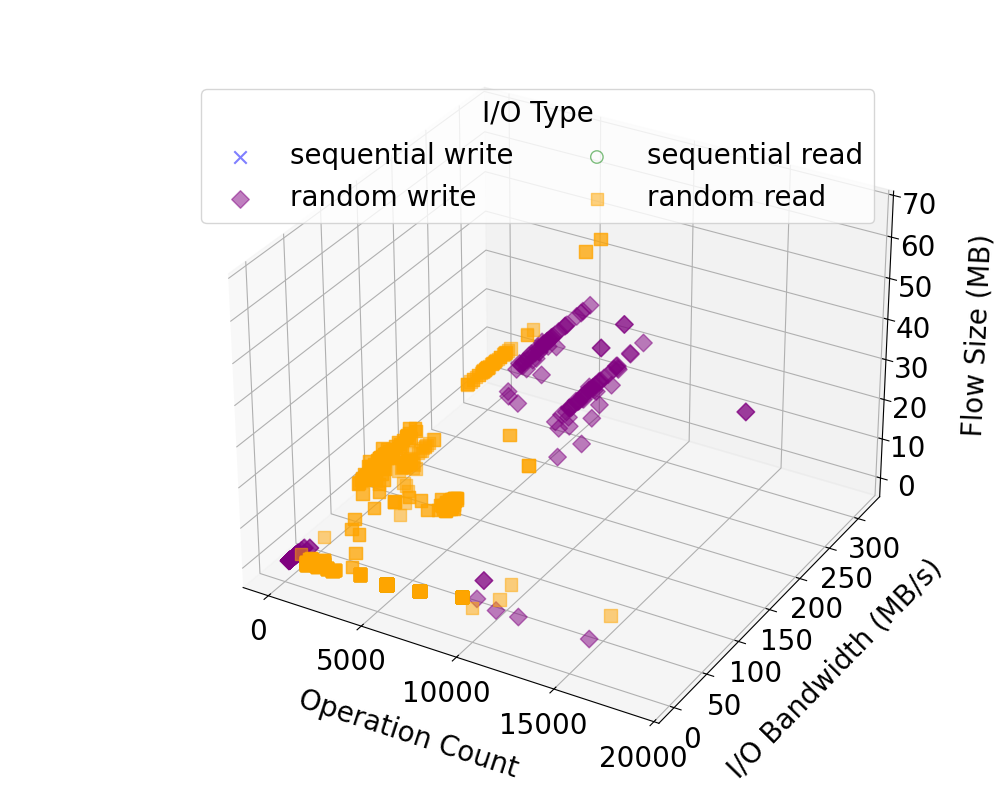

In [498]:
# 3D plot: Relationship between aggregateFilesizeMB, opCount, and trMiB
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot actual data for present I/O types
for io_type, color in io_color_map.items():
    subset = df[df['io_type'] == io_type]
    marker = io_marker_map[io_type]
    facecolor = 'none' if marker == 'o' else color

    if not subset.empty:
        ax.scatter(
            subset['opCount'],
            subset['trMiB'],
            subset['aggregateFilesizeMB'],
            label=io_type,
            edgecolor=color,
            facecolors=facecolor,
            marker=marker,
            s=80,
            alpha=0.5
        )
    else:
        # Add a dummy scatter for missing data to include in legend
        ax.scatter([], [], [], 
                   label=io_type,
                   edgecolor=color,
                   facecolors='none' if marker == 'o' else color,
                   marker=marker,
                   s=80,
                   alpha=0.5)

# Font size settings
plt.rc('font', size=20)
plt.rc('axes', titlesize=24)
plt.rc('axes', labelsize=24)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.rc('legend', fontsize=20)

ax.set_xlabel('Operation Count', labelpad=20)
ax.set_ylabel('I/O Bandwidth (MB/s)', labelpad=20)
ax.set_zlabel('Flow Size (MB)', labelpad=20)

ax.legend(title="I/O Type", loc='best', bbox_to_anchor=(0, 0.72, 0.8, 0.0), ncol=2)

plt.tight_layout()
plt.show()
fig.savefig(f"{result_path}/op_{plot_file_name}")

/tmp/ipykernel_38332/2147089657.py:25: UserWarning: You passed a edgecolor/edgecolors ('blue') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter([], [], [],


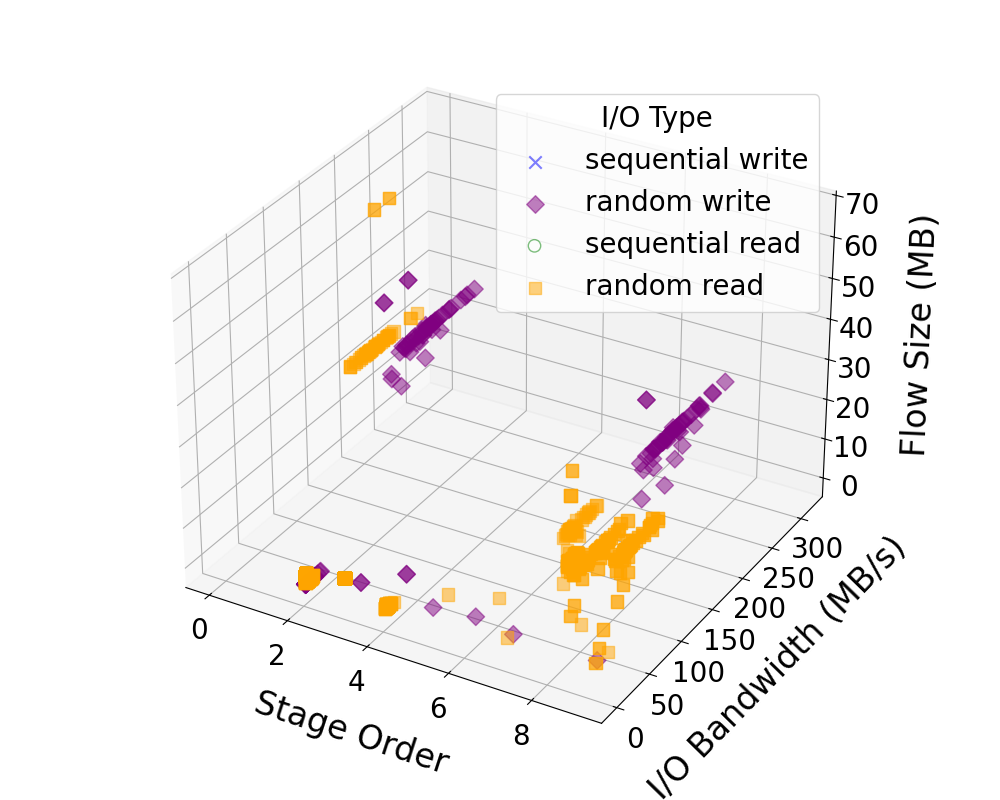

In [499]:
# 3D plot: Relationship between aggregateFilesizeMB, stageOrder, and trMiB
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot for each defined I/O type, whether or not data exists
for io_type, color in io_color_map.items():
    subset = df[df['io_type'] == io_type]
    marker = io_marker_map[io_type]
    facecolor = 'none' if marker == 'o' else color

    if not subset.empty:
        ax.scatter(
            subset['stageOrder'],
            subset['trMiB'],
            subset['aggregateFilesizeMB'],
            label=io_type,
            edgecolor=color,
            facecolors=facecolor,
            marker=marker,
            s=80,
            alpha=0.5
        )
    else:
        # Dummy point for legend
        ax.scatter([], [], [],
                   label=io_type,
                   edgecolor=color,
                   facecolors=facecolor,
                   marker=marker,
                   s=80,
                   alpha=0.5)

# Font size settings
plt.rc('font', size=20)
plt.rc('axes', titlesize=24)
plt.rc('axes', labelsize=24)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.rc('legend', fontsize=20)

# Switched axes
ax.set_xlabel('Stage Order', labelpad=20)
ax.set_ylabel('I/O Bandwidth (MB/s)', labelpad=20)
ax.set_zlabel('Flow Size (MB)', labelpad=20)

ax.legend(title="I/O Type", loc='best', bbox_to_anchor=(0.15, 0.6, 0.8, 0.0))

plt.tight_layout()
plt.show()
fig.savefig(f"{result_path}/stage_{plot_file_name}")


{'run_idfeature': {'stage_order': 1, 'parallelism': 48, 'num_tasks': 48, 'predecessors': {'initial_data': {'inputs': ['pr_rlut_mean_sam_\\d{10}\\.nc']}}, 'outputs': ['cloudid_\\d{8}_\\d{6}\\.nc']}, 'run_tracksingle': {'stage_order': 2, 'parallelism': 48, 'num_tasks': 48, 'predecessors': {'run_idfeature': {'inputs': ['cloudid_\\d{8}_\\d{6}\\.nc']}}, 'outputs': ['track_\\d{8}_\\d{6}\\.nc']}, 'run_gettracks': {'stage_order': 3, 'parallelism': 1, 'num_tasks': 1, 'predecessors': {'run_tracksingle': {'inputs': ['track_\\d{8}_\\d{6}\\.nc']}, 'run_idfeature': {'inputs': ['cloudid_\\d{8}_\\d{6}\\.nc']}}, 'outputs': ['tracknumbers_\\d{8}\\.\\d{4}_\\d{8}\\.\\d{4}\\.nc']}, 'run_trackstats': {'stage_order': 4, 'parallelism': 48, 'num_tasks': 48, 'predecessors': {'run_gettracks': {'inputs': ['tracknumbers_\\d{8}\\.\\d{4}_\\d{8}\\.\\d{4}\\.nc']}, 'run_idfeature': {'inputs': ['cloudid_\\d{8}_\\d{6}\\.nc']}}, 'outputs': ['trackstats_\\d{8}\\.\\d{4}_\\d{8}\\.\\d{4}\\.nc', 'trackstats_sparse_\\d{8}\\.\\d

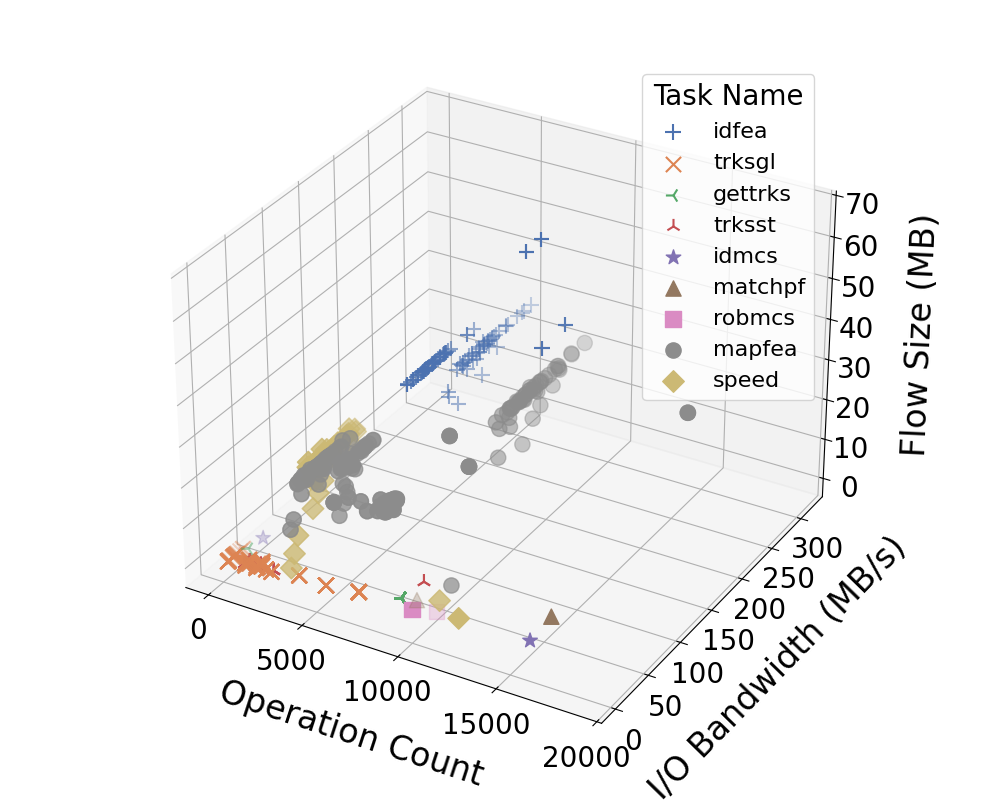

In [500]:
import seaborn as sns
import json


# Load task ordering json file
task_order_dict = {}
with open(task_order_file) as f:
    task_order_dict = json.load(f)

print(task_order_dict)

# Ensure tasks are ordered based on task_order_dict
unique_tasks = sorted(
    df['taskName'].unique(), 
    key=lambda t: task_order_dict.get(t, {}).get('stage_order', float('inf'))
)

# Debugging output
print(f"Unique tasks: {unique_tasks}")  
if not unique_tasks:
    print("No tasks found, skipping plotting.")
    exit()

num_tasks = len(unique_tasks)

# Define color palette and markers
palette = sns.color_palette("deep", num_tasks)
markers = ['+', 'x', '3', '2', '*', '^', 's', 'o', 'D', 'p', 'h']

# Split tasks into groups of 5
task_group_count = 15
task_groups = [unique_tasks[i:i+task_group_count] for i in range(0, num_tasks, task_group_count)]

for group_idx, task_group in enumerate(task_groups):


    # Filter out empty groups
    valid_tasks = [task for task in task_group if task in df['taskName'].values]
    print(f"Group {group_idx+1}: {valid_tasks}")
    if not valid_tasks:
        print(f"Skipping empty group {group_idx+1}")
        continue

    # 3D plot: Relationship between aggregateFilesizeMB, totalTime, and trMiB
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    x = df['trMiB']
    y = df['opCount']
    z = df['aggregateFilesizeMB']
    # markers = ['+', 'x', '3', '2', '*', '^', 's', 'o', 'D', 'p', 'h']  # Add more markers as needed

    # Generate color and marker maps for current group
    color_map = {task: palette[i % len(palette)] for i, task in enumerate(valid_tasks)}
    marker_map = {task: markers[i % len(markers)] for i, task in enumerate(valid_tasks)}

    df['color'] = df['taskName'].map(lambda task: color_map.get(task, 'black'))  # Black if not found
    df['marker'] = df['taskName'].map(lambda task: marker_map.get(task, 'o'))  # 'o' if not found

    for task in valid_tasks:
        subset = df[df['taskName'] == task]
        if subset.empty:
            print(f"Skipping task '{task}' (no data)")
            continue

        ax.scatter(subset['opCount'], subset['trMiB'], subset['aggregateFilesizeMB'], 
                   label=shorten_task_name(task), 
                   color=color_map[task], 
                   marker=marker_map[task],
                   s=120)

    # Set labels and title
    plt.rc('font', size=20)
    plt.rc('axes', titlesize=24)
    plt.rc('axes', labelsize=24)
    plt.rc('xtick', labelsize=20)
    plt.rc('ytick', labelsize=20)
    plt.rc('legend', fontsize=16)
    
    ax.set_xlabel('Operation Count', labelpad=20)
    ax.set_ylabel('I/O Bandwidth (MB/s)', labelpad=20)
    ax.set_zlabel('Flow Size (MB)', labelpad=20)

    ax.legend(title="Task Name", loc="right", bbox_to_anchor=(0.14, 0.72, 0.8, 0.0)) # (0, 0.83, 0.8, 0.0) (0, 0.6, 1.3, 0.0)
    fig.tight_layout()
    # plt.figure(constrained_layout=True)

    plt.show()
    fig.savefig(f'{result_path}/taskColor_group{group_idx+1}_'+plot_file_name)


In [501]:
import re
import os


# def extract_group(filename, extension_only=False):
#     if extension_only:
#         # Only group by file extension
#         ext = filename.rsplit('.', 1)[-1] if '.' in filename else ''
#         return ext if ext else 'no_extension'

#     if "_" in filename:
#         # Keep the original method if the filename contains '_'
#         for pattern in file_group_patterns:
#             if re.match(pattern, filename):
#                 base, ext = filename.rsplit('.', 1) if '.' in filename else (filename, '')
#                 prefix = re.split(r'\d', base, 1)[0].rstrip('_')  # Extract text before first number
#                 return f"{prefix}.{ext}" if ext else prefix  # Include file extension
#         return "other"  # Default group

#     elif any(char.isdigit() for char in filename):
#         # If the filename contains a number, split before the first number and keep the extension
#         base, ext = filename.rsplit('.', 1) if '.' in filename else (filename, '')
#         prefix = re.split(r'\d', base, 1)[0]
#         return f"{prefix}.{ext}" if ext else prefix

#     else:
#         # If no underscore and no numbers, return the filename itself as the group
#         return filename

# # Add a new column to categorize file groups
# df["file_group"] = df["fileName"].apply(extract_group, extension_only=extension_grouping)

# # Check the unique file groups
# print(f'Unique file groups: {df["file_group"].unique()}')

# Compile regex patterns once
compiled_patterns = [(pattern, re.compile(pattern)) for pattern in file_group_patterns]

def extract_group(filename):
    for pattern_str, pattern in compiled_patterns:
        if pattern.search(filename):
            return pattern_str.replace("\\", "")  # Remove backslashes
    return "group_other"


# Apply to dataframe
df["file_group"] = df["fileName"].apply(extract_group)

# Check results
print("Unique file groups:")
print(df["file_group"].value_counts())

def padded_range(series, pad_ratio=0.05):
    """Return min and max with padding based on data range."""
    min_val = series.min()
    max_val = series.max()
    pad = (max_val - min_val) * pad_ratio
    return min_val - pad, max_val + pad

Unique file groups:
file_group
cloudid_.*.nc           537
track_.*.nc             232
pr_rlut_.*.nc            48
tracknumbers_.*.nc       48
IMERG_landmask_.*.nc     46
mcs_tracks_.*.nc          8
trackstats_.*.nc          3
Name: count, dtype: int64


Unique groups [7]: ['pr_rlut_.*.nc' 'cloudid_.*.nc' 'track_.*.nc' 'tracknumbers_.*.nc'
 'trackstats_.*.nc' 'mcs_tracks_.*.nc' 'IMERG_landmask_.*.nc']


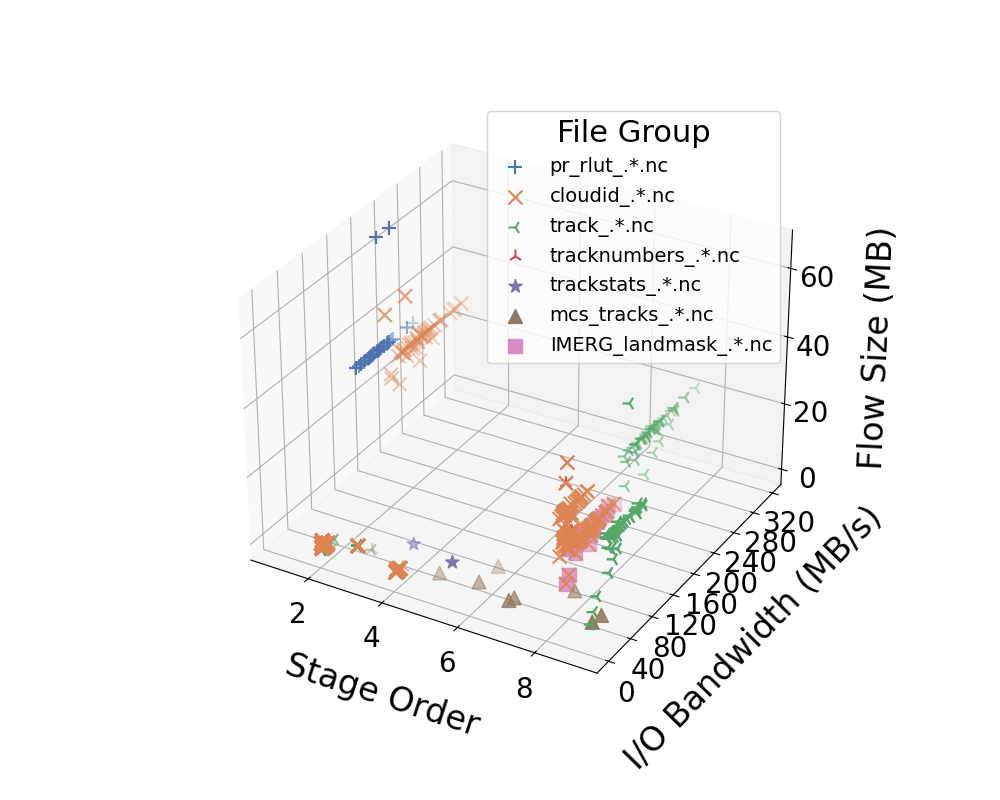

In [502]:

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Generate a color palette
unique_groups = df["file_group"].unique()
print(f"Unique groups [{len(unique_groups)}]: {unique_groups}")

num_groups = len(unique_groups)

# Define color palette and markers
# Define color palette and markers
palette = sns.color_palette("deep", num_groups)
markers = ['+', 'x', '3', '2', '*', '^', 's', 'o', 'D', 'p', 'h']

# Groups to exclude for 1000 genome
exclude_groups = ['AFR', 'EAS', 'SAS', 'ALL', 'EUR', 'GBR', 'AMR']
# Remove them from unique_groups
unique_groups = [g for g in unique_groups if g not in exclude_groups]

# Split file groups into groups of n
file_group_count = 20
group_batches = [unique_groups[i:i+file_group_count] for i in range(0, num_groups, file_group_count)]

for batch_idx, group_batch in enumerate(group_batches):
    # Skip empty groups
    valid_groups = [group for group in group_batch if group in df["file_group"].values]
    if not valid_groups:
        print(f"Skipping empty group {batch_idx+1}")
        continue

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Generate color and marker maps for current group
    color_map = {group: palette[i % len(palette)] for i, group in enumerate(valid_groups)}
    marker_map = {group: markers[i % len(markers)] for i, group in enumerate(valid_groups)}

    # Assign colors and markers
    df["color"] = df["file_group"].map(lambda group: color_map.get(group, 'black'))
    df["marker"] = df["file_group"].map(lambda group: marker_map.get(group, 'o'))

    # Iterate through the valid file groups
    for group in valid_groups:
        subset = df[df["file_group"] == group]
        if subset.empty:
            print(f"Skipping group '{group}' (no data)")
            continue

        # ax.scatter(subset['trMiB'], subset['stageOrder'], subset['aggregateFilesizeMB'], 
        ax.scatter(subset['stageOrder'], subset['trMiB'], subset['aggregateFilesizeMB'], 
                   label=group, 
                   color=color_map[group],  
                   marker=marker_map[group],  
                   s=100)
    
    # Set font sizes
    plt.rc('font', size=22)
    plt.rc('axes', titlesize=24)
    plt.rc('axes', labelsize=24)
    plt.rc('xtick', labelsize=20)
    plt.rc('ytick', labelsize=20)
    plt.rc('legend', fontsize=14)

    # Set axis labels
    ax.set_xlabel('Stage Order', labelpad=20)
    ax.set_ylabel('I/O Bandwidth (MB/s)', labelpad=20)
    ax.set_zlabel('Flow Size (MB)', labelpad=20)
    
    # Ensure y-axis only shows integers
    ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

    # Legend updated to reflect file groups
    ax.legend(title="File Group", loc="best", bbox_to_anchor=(0.15, 0.55, 0.8, 0.0))

    # plt.figure(constrained_layout=True)

    # Show and save figure
    fig.savefig(f'{result_path}/fileColor_group{batch_idx+1}_stage_'+plot_file_name)
    plt.show()

    



Unique groups [7]: ['pr_rlut_.*.nc' 'cloudid_.*.nc' 'track_.*.nc' 'tracknumbers_.*.nc'
 'trackstats_.*.nc' 'mcs_tracks_.*.nc' 'IMERG_landmask_.*.nc']


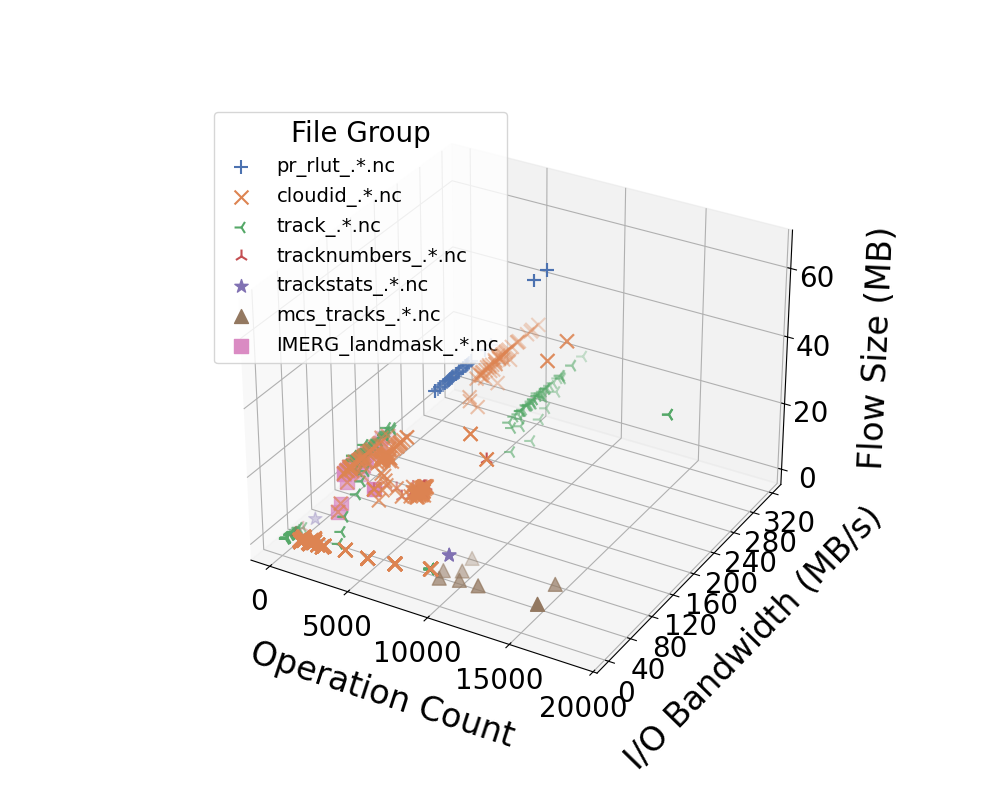

In [503]:

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Generate a color palette
unique_groups = df["file_group"].unique()
print(f"Unique groups [{len(unique_groups)}]: {unique_groups}")

num_groups = len(unique_groups)

# Define color palette and markers
palette = sns.color_palette("deep", num_groups)
markers = ['+', 'x', '3', '2', '*', '^', 's', 'o', 'D', 'p', 'h']

# Groups to exclude for 1000 genome
exclude_groups = ['AFR', 'EAS', 'SAS', 'ALL', 'EUR', 'GBR', 'AMR']
# Remove them from unique_groups
unique_groups = [g for g in unique_groups if g not in exclude_groups]

# Split file groups into groups of n
file_group_count = 20
group_batches = [unique_groups[i:i+file_group_count] for i in range(0, num_groups, file_group_count)]

for batch_idx, group_batch in enumerate(group_batches):
    # Skip empty groups
    valid_groups = [group for group in group_batch if group in df["file_group"].values]
    if not valid_groups:
        print(f"Skipping empty group {batch_idx+1}")
        continue

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Generate color and marker maps for current group
    color_map = {group: palette[i % len(palette)] for i, group in enumerate(valid_groups)}
    marker_map = {group: markers[i % len(markers)] for i, group in enumerate(valid_groups)}

    # Assign colors and markers
    df["color"] = df["file_group"].map(lambda group: color_map.get(group, 'black'))
    df["marker"] = df["file_group"].map(lambda group: marker_map.get(group, 'o'))

    # Iterate through the valid file groups
    for group in valid_groups:
        subset = df[df["file_group"] == group]
        if subset.empty:
            print(f"Skipping group '{group}' (no data)")
            continue

        ax.scatter(subset['opCount'], subset['trMiB'], subset['aggregateFilesizeMB'], 
                   label=group, 
                   color=color_map[group],  
                   marker=marker_map[group],  
                   s=100)
    # # After plotting all groups, set axis limits based on data
    # all_subset = df[df["file_group"].isin(valid_groups)]
    # ax.set_xlim(*padded_range(all_subset["trMiB"]))
    # ax.set_ylim(*padded_range(all_subset["stageOrder"]))
    # ax.set_zlim(*padded_range(all_subset["aggregateFilesizeMB"]))
    
    # Set font sizes
    plt.rc('font', size=20)
    plt.rc('axes', titlesize=24)
    plt.rc('axes', labelsize=24)
    plt.rc('xtick', labelsize=20)
    plt.rc('ytick', labelsize=20)
    plt.rc('legend', fontsize=14)

    # Set axis labels
    ax.set_xlabel('Operation Count', labelpad=20)
    ax.set_ylabel('I/O Bandwidth (MB/s)', labelpad=20)
    ax.set_zlabel('Flow Size (MB)', labelpad=20)
    
    # Ensure y-axis only shows integers
    ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

    # Legend updated to reflect file groups
    ax.legend(title="File Group", loc="best", bbox_to_anchor=(0, 0.55, 0.8, 0.0))

    # plt.figure(constrained_layout=True)

    # Show and save figure
    fig.savefig(f'{result_path}/fileColor_group{batch_idx+1}_op_'+plot_file_name)
    plt.show()


In [504]:

# print if any value is nan
print(df['stageOrder'].isna().any())
df['stageOrder'].unique()

False


array([1, 2, 3, 4, 5, 6, 7, 8, 9])

In [505]:
# # Split into read and write I/O operations
# df_reads = df[df['operation'] == 1].copy()
# df_writes = df[df['operation'] == 0].copy()

# # Merge based on matching fileName and task linkage (write.taskName == read.prevTask)
# df_pc = pd.merge(
#     df_reads,
#     df_writes,
#     left_on=['fileName', 'prevTask'],
#     right_on=['fileName', 'taskName'],
#     suffixes=('_read', '_write')
# )

# print(f"Producer-Consumer pairs: {df_pc.shape[0]}")

# # Ensure required columns exist
# required_cols = [
#     'transferSize_read', 'transferSize_write',
#     'aggregateFilesizeMB_read', 'aggregateFilesizeMB_write',
#     'totalTime_read', 'totalTime_write',
#     'opCount_read', 'opCount_write',
#     'trMiB_read', 'trMiB_write'
# ]

# # Compute aggregates and average
# df_pc['transferSize'] = df_pc['transferSize_read'] + df_pc['transferSize_write']
# df_pc['aggregateFilesizeMB'] = df_pc['aggregateFilesizeMB_read'] + df_pc['aggregateFilesizeMB_write']
# df_pc['totalTime'] = df_pc['totalTime_read'] + df_pc['totalTime_write']
# df_pc['opCount'] = df_pc['opCount_read'] + df_pc['opCount_write']
# df_pc['trMiB'] = (df_pc['trMiB_read'] + df_pc['trMiB_write']) / 2

# # Create simplified producer-consumer DataFrame
# df_producer_consumer = df_pc[[
#     'taskName_write', 'taskName_read', 'fileName',
#     'transferSize', 'aggregateFilesizeMB', 'totalTime', 'opCount', 'trMiB',
#     'stageOrder_write', 'stageOrder_read'
# ]].rename(columns={
#     'taskName_write': 'producerTask',
#     'taskName_read': 'consumerTask'
# })

manual_pairs = {
    ("idfea", "trksgl") : "n-n",
    ("trksgl", "gettrks") : "n-1",
    ("idfea", "gettrks") : "n-1",
    ("gettrks", "trksst"): "1-n",
    ("idfea", "trksst"): "1-1",
    ("trksst", "idmcs"): "1-1",
    ("idmcs", "matchpf"): "1-1",
    ("matchpf", "robmcs"): "1-1",
    ("robmcs", "mapfea"): "1-1",
    ("idfea", "mapfea"): "n-n",
    ("mapfea", "speed"): "n-n",
    ("robmcs", "speed"): "1-1",
    ("initial_data", "idfea"): "1-1",
    ("speed", "final_data"): "1-1",
    ("trksst", "final_data"): "1-1",
}

# Combine based on your manual producer-consumer task pairs
rows = []
for producer, consumer in manual_pairs.keys():
    pc_label = producer + '→' + consumer
    
    if consumer == "final_data":
        df_subset_write = df[(df['operation'] == 0) & (df['taskName'] == producer) & (df['prevTask'] == consumer)]
        if df_subset_write.empty:
            print(f"Skipping special pair ({pc_label}): no data")
            continue
        
        if df_subset_write['parallelism'].mean() > 1:
            subset_write_bw = df_subset_write['trMiB'].sum() if not df_subset_write.empty else 0
        else:
            subset_write_bw = df_subset_write['trMiB'].mean() if not df_subset_write.empty else 0

        row = {
            'producerTask': producer,
            'consumerTask': consumer,
            'producer_parallelism': df_subset_write['parallelism'].mean(),
            'consumer_parallelism': 0,
            'transferSize': df_subset_write['transferSize'].sum(),
            'aggregateFilesizeMB': df_subset_write['aggregateFilesizeMB'].sum(),
            'totalTime': df_subset_write['totalTime'].sum(),
            'opCount': df_subset_write['opCount'].sum(),
            'trMiB': subset_write_bw,
            'stageOrder_read': int(df_subset_write['stageOrder'].mean()),
            'stageOrder_write': int(df_subset_write['stageOrder'].mean()),
            'pcPair': pc_label
        }
        rows.append(row)
        continue
    if producer == "initial_data":        
        df_subset_read = df[(df['operation'] == 1) & (df['taskName'] == consumer) & (df['prevTask'] == producer)]
        if df_subset_read.empty:
            print(f"Skipping special pair ({pc_label}): no data")
            # Printe the dataframe's taskName and prevTask
            # print(f"Producer: {producer}, Consumer: {consumer}, df_subset_read: {df_subset_read[['prevTask', 'taskName']]}")
            continue
        
        if df_subset_read['parallelism'].mean() > 1:
            subset_read_bw = df_subset_read['trMiB'].sum() if not df_subset_read.empty else 0
        else:
            subset_read_bw = df_subset_read['trMiB'].mean() if not df_subset_read.empty else 0
        
        row = {
            'producerTask': producer,
            'consumerTask': consumer,
            'producer_parallelism': 0,
            'consumer_parallelism': df_subset_read['parallelism'].mean(),
            'transferSize': df_subset_read['transferSize'].sum(),
            'aggregateFilesizeMB': df_subset_read['aggregateFilesizeMB'].sum(),
            'totalTime': df_subset_read['totalTime'].sum(),
            'opCount': df_subset_read['opCount'].sum(),
            'trMiB': subset_read_bw,
            'stageOrder_read': int(df_subset_read['stageOrder'].mean()),
            'stageOrder_write': int(df_subset_read['stageOrder'].mean()),
            'pcPair': pc_label
        }
        rows.append(row)
        continue
    else:
        # Regular handling
        df_subset_pc_read = df[(df['operation'] == 1) & (df['taskName'] == consumer) & (df['prevTask'] == producer)]
        # check if any of the dataframes are empty
        if df_subset_pc_read.empty:
            print(f"Skipping pair ({pc_label}): no data")
            # Printe the dataframe's taskName and prevTask
            print(f"Producer: {producer}, Consumer: {consumer}, df_subset_pc: {df_subset_pc_read[['prevTask', 'taskName']]}")
            continue
        # get list of unique file names
        consumer_files = df_subset_pc_read['fileName'].unique()
        # get the dataframe with the same file names
        df_subset_pc_write = df[(df['operation'] == 0) & (df['taskName'] == producer) & (df['fileName'].isin(consumer_files))]
        
        if df_subset_pc_write.empty:
            print(f"Skipping pair ({pc_label}): no data")
            # Printe the dataframe's taskName and prevTask
            print(f"Producer: {producer}, Consumer: {consumer}, df_subset_pc: {df_subset_pc_write[['prevTask', 'taskName']]}")
            continue
        
        
        producer_parallelism = df_subset_pc_write['parallelism'].mean()
        consumer_parallelism = df_subset_pc_read['parallelism'].mean()
        # print(f"Producer: {producer}, Consumer: {consumer}, Producer Parallelism: {producer_parallelism}, Consumer Parallelism: {consumer_parallelism}")
        
        if producer_parallelism > 1:
            # If parallelism > 1, use sum
            subset_write_bw = df_subset_pc_write['trMiB'].sum() if not df_subset_pc_write.empty else 0
        else:
            # If parallelism <= 1, use mean
            subset_write_bw = df_subset_pc_write['trMiB'].mean() if not df_subset_pc_write.empty else 0
        
        if consumer_parallelism > 1:
            # If parallelism > 1, use sum
            subset_read_bw = df_subset_pc_read['trMiB'].sum() if not df_subset_pc_read.empty else 0
        else:
            # If parallelism <= 1, use mean
            subset_read_bw = df_subset_pc_read['trMiB'].mean() if not df_subset_pc_read.empty else 0

        row = {
            'producerTask': producer,
            'consumerTask': consumer,
            'producer_parallelism': producer_parallelism,
            'consumer_parallelism': consumer_parallelism,
            'transferSize': df_subset_pc_write['transferSize'].mean() + df_subset_pc_read['transferSize'].mean(),
            'aggregateFilesizeMB': df_subset_pc_write['aggregateFilesizeMB'].sum() + df_subset_pc_read['aggregateFilesizeMB'].sum(),
            'totalTime': df_subset_pc_write['totalTime'].sum() + df_subset_pc_read['totalTime'].sum(),
            'opCount': df_subset_pc_write['opCount'].sum() + df_subset_pc_read['opCount'].sum(),
            'trMiB': (subset_write_bw + subset_read_bw) / 2,
            'stageOrder_read': int(df_subset_pc_read['stageOrder'].mean()),
            'stageOrder_write': int(df_subset_pc_write['stageOrder'].mean()),
            'pcPair': pc_label
        }

        rows.append(row)

# Create DataFrame
df_pc = pd.DataFrame(rows)

# Show summary
print(f"Constructed producer-consumer DataFrame with {len(df_pc)} pairs.")
print(df_pc[['pcPair', 'aggregateFilesizeMB', 'totalTime', 'trMiB', 'producer_parallelism', 'consumer_parallelism']])

# Optional: create pair label
df_pc['pcPair'] = df_pc['producerTask'] + '→' + df_pc['consumerTask']

# Get unique producer-consumer pairs
unique_pairs = df_pc['pcPair'].unique()
if len(unique_pairs) == 0:
    print("No producer-consumer pairs available for plotting.")
    exit()

print(f"Unique producer-consumer pairs: {unique_pairs}")


Constructed producer-consumer DataFrame with 15 pairs.
                pcPair  aggregateFilesizeMB   totalTime         trMiB  \
0         idfea→trksgl          1607.095629   82.731909   6176.809086   
1       trksgl→gettrks           239.718412   82.847283    272.685515   
2        idfea→gettrks          1536.798351   88.949442   5608.624775   
3       gettrks→trksst             0.392243    0.017758     20.869312   
4         idfea→trksst          1166.995915   15.743632   5072.350472   
5         trksst→idmcs             6.158045    0.176521     35.251298   
6        idmcs→matchpf             4.225140    0.195629     32.517869   
7       matchpf→robmcs             6.013497    1.694914      9.530969   
8        robmcs→mapfea             4.457645    0.255356     31.087252   
9         idfea→mapfea          5940.591755  115.976879  11464.310009   
10        mapfea→speed          3248.836182   43.633263   7131.907527   
11        robmcs→speed             4.509896    0.288010     19.848411

In [506]:
print("=== aggregateFilesizeMB Range ===")
print(f"df_pc: min = {df_pc['aggregateFilesizeMB'].min():.2f}, max = {df_pc['aggregateFilesizeMB'].max():.2f}")
print(f"df   : min = {df['aggregateFilesizeMB'].min():.2f}, max = {df['aggregateFilesizeMB'].max():.2f}")


=== aggregateFilesizeMB Range ===
df_pc: min = 0.39, max = 5940.59
df   : min = 0.11, max = 66.19


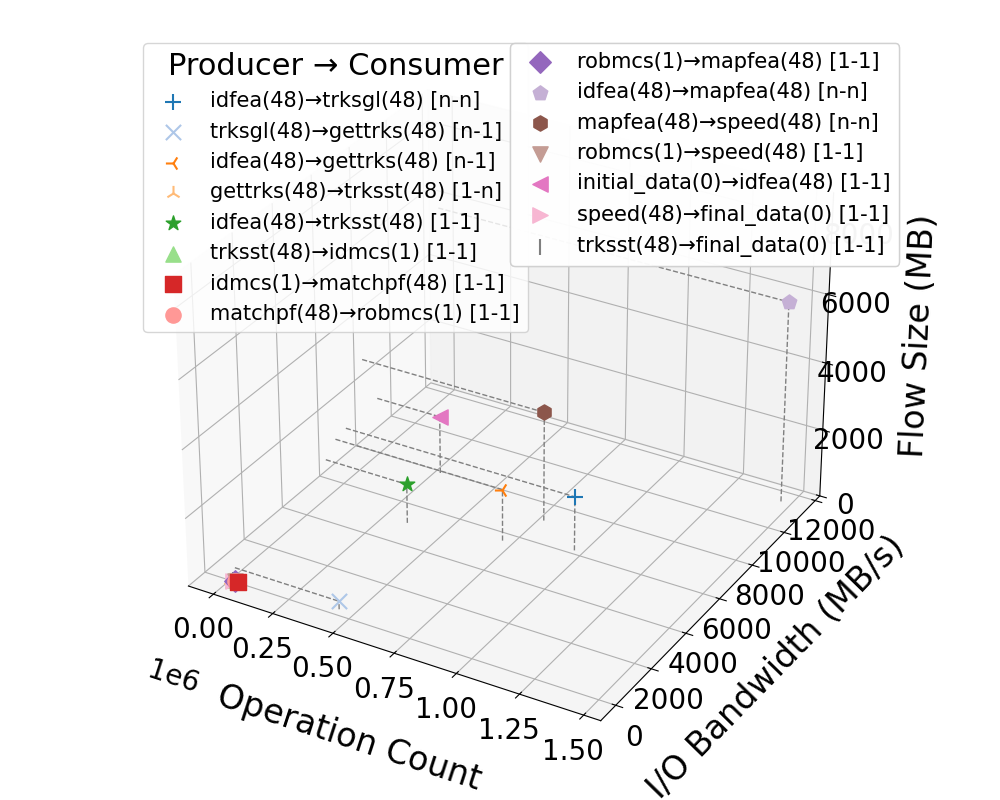

In [507]:


# Plot settings
palette = sns.color_palette("tab20", len(unique_pairs))
markers = ['+', 'x', '3', '2', '*', '^', 's', 'o', 'D', 'p', 'h', 'v', '<', '>', '|']
pair_group_count = 15
pair_groups = [unique_pairs[i:i+pair_group_count] for i in range(0, len(unique_pairs), pair_group_count)]

for group_idx, pair_group in enumerate(pair_groups):
    subset_group = df_pc[df_pc['pcPair'].isin(pair_group)]
    if subset_group.empty:
        print(f"Skipping empty group {group_idx+1}")
        continue

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Assign colors and markers
    color_map = {pair: palette[i % len(palette)] for i, pair in enumerate(pair_group)}
    marker_map = {pair: markers[i % len(markers)] for i, pair in enumerate(pair_group)}

    seen_labels = set()  # Track labels we've already added

    for _, row in subset_group.iterrows():
        pair_label = row['pcPair']
        producer, consumer = pair_label.split('→')
        short_producer = shorten_task_name(producer)
        short_consumer = shorten_task_name(consumer)

        # Fetch pattern from manual_pairs
        pattern = manual_pairs.get((producer, consumer), "unknown")
        short_label = f"{short_producer}({int(row['producer_parallelism'])})→{short_consumer}({int(row['consumer_parallelism'])}) [{pattern}]"

        show_label = pair_label not in seen_labels
        seen_labels.add(pair_label)

        trMiB = row['trMiB'] if pd.notna(row['trMiB']) else 0
        opCount = row['opCount'] if pd.notna(row['opCount']) else 0
        filesize = row['aggregateFilesizeMB'] if pd.notna(row['aggregateFilesizeMB']) else 0

        ax.scatter(
            opCount, trMiB, filesize,
            label=short_label if show_label else None,
            color=color_map[pair_label],
            marker=marker_map[pair_label],
            s=120
        )
        ax.plot([opCount, opCount], [trMiB, trMiB], [0, filesize], linestyle='dashed', color='gray', linewidth=1)
        # ax.plot([opCount, opCount], [0, trMiB], [filesize, filesize], linestyle='dashed', color='gray', linewidth=1)
        ax.plot([0, opCount], [trMiB, trMiB], [filesize, filesize], linestyle='dashed', color='gray', linewidth=1)



    # Styling
    plt.rcParams.update({
        'font.size': 22,
        'axes.titlesize': 20,
        'axes.labelsize': 20,
        'xtick.labelsize': 20,
        'ytick.labelsize': 20,
        'legend.fontsize': 15
    })

    
    ax.set_xlabel('Operation Count', labelpad=23)
    ax.set_ylabel('I/O Bandwidth (MB/s)', labelpad=20)
    ax.set_zlabel('Flow Size (MB)', labelpad=20)
    # set zlim to 0 to max * 1.1
    ax.set_zlim(0, df_pc['aggregateFilesizeMB'].max() * 1.5)
    
    # ax.legend(title="Producer → Consumer", loc="lower left", bbox_to_anchor=(0, 0.7, 1, 1), ncol=2)
    handles, labels = ax.get_legend_handles_labels()
    first_col_handles = handles[:8]
    first_col_labels = labels[:8]
    second_col_handles = handles[8:]
    second_col_labels = labels[8:]

    # First legend
    legend1 = ax.legend(first_col_handles, first_col_labels, title="Producer → Consumer", loc="upper left", bbox_to_anchor=(0.0, 1.0))

    # Second legend
    legend2 = ax.legend(second_col_handles, second_col_labels, loc="upper left", bbox_to_anchor=(0.5, 1.0))

    # Add both legends to the axis
    ax.add_artist(legend1)
    ax.add_artist(legend2)

    plt.tight_layout()
    plt.show()
    fig.savefig(f'{result_path}/pcAgg_group{group_idx+1}_{plot_file_name}')

In [508]:
print(df[['operation', 'taskName', 'prevTask', 'fileName']].head(20))

    operation taskName      prevTask                        fileName
0           1    idfea  initial_data  pr_rlut_mean_sam_2016080111.nc
1           0    idfea           NaN      cloudid_20160801_111500.nc
2           0    idfea           NaN      cloudid_20160802_191500.nc
3           1    idfea  initial_data  pr_rlut_mean_sam_2016080219.nc
4           0    idfea           NaN      cloudid_20160801_231500.nc
5           1    idfea  initial_data  pr_rlut_mean_sam_2016080123.nc
6           0    idfea           NaN      cloudid_20160802_181500.nc
7           1    idfea  initial_data  pr_rlut_mean_sam_2016080218.nc
8           0    idfea           NaN      cloudid_20160802_151500.nc
9           1    idfea  initial_data  pr_rlut_mean_sam_2016080215.nc
10          0    idfea           NaN      cloudid_20160801_081500.nc
11          1    idfea  initial_data  pr_rlut_mean_sam_2016080108.nc
12          0    idfea           NaN      cloudid_20160802_061500.nc
13          1    idfea  initial_da

In [509]:
print(unique_groups)

['pr_rlut_.*.nc', 'cloudid_.*.nc', 'track_.*.nc', 'tracknumbers_.*.nc', 'trackstats_.*.nc', 'mcs_tracks_.*.nc', 'IMERG_landmask_.*.nc']


/tmp/ipykernel_38332/1186687784.py:45: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(hspace=0.4, wspace=0.4)


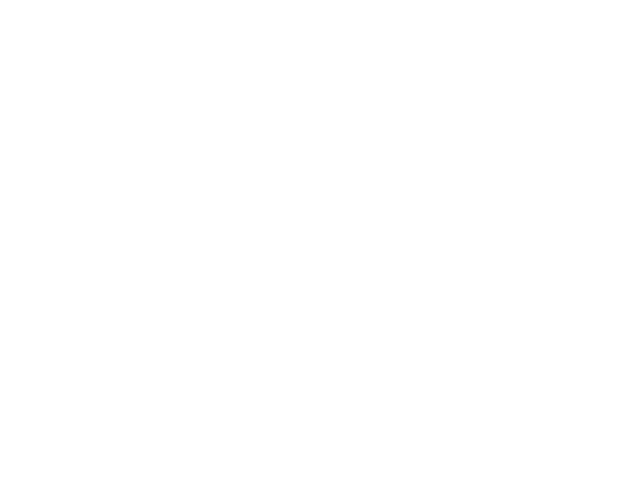

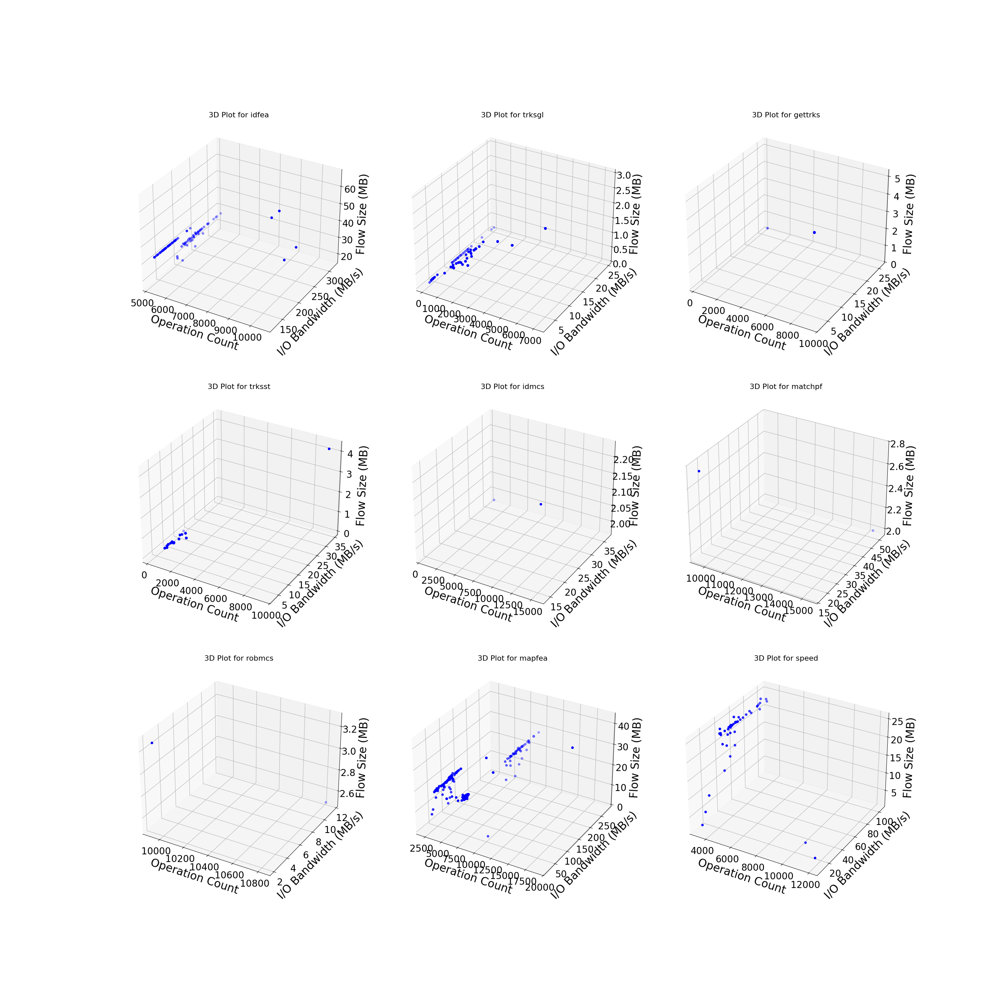

In [510]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

x = df['trMiB']
y = df['opCount']
z = df['aggregateFilesizeMB']

# Generate a color palette
unique_tasks = df['taskName'].unique()
num_tasks = len(unique_tasks)

# Set the font sizes for various plot elements
plt.rc('font', size=18)             # Default text size
plt.rc('axes', titlesize=16)        # Axes title font size
plt.rc('axes', labelsize=24)        # Axes label font size
plt.rc('xtick', labelsize=20)       # X-tick label font size
plt.rc('ytick', labelsize=20)       # Y-tick label font size
plt.rc('legend', fontsize=16)       # Legend font size

# Determine the grid layout based on the number of tasks
num_cols = min(3, num_tasks)  # Max 3 columns per row
num_rows = int(np.ceil(num_tasks / num_cols))  # Calculate required rows

# Create a figure and define the GridSpec
fig = plt.figure(figsize=(num_cols * 10, num_rows * 10))
gs = gridspec.GridSpec(num_rows, num_cols)

# Generate grid positions dynamically
task_indices = [(i // num_cols, i % num_cols) for i in range(num_tasks)]

for i, (task, (row, col)) in enumerate(zip(unique_tasks, task_indices)):
    subset = df[df['taskName'] == task]
    ax = fig.add_subplot(gs[row, col], projection='3d')
    ax.scatter(subset['opCount'], subset['trMiB'], subset['aggregateFilesizeMB'], 
               label=shorten_task_name(task), 
               color='b')
    ax.set_title(f'3D Plot for {task}')
    ax.set_ylabel('I/O Bandwidth (MB/s)', labelpad=10)
    ax.set_xlabel('Operation Count', labelpad=13)
    ax.set_zlabel('Flow Size (MB)', labelpad=10)

plt.figure(constrained_layout=True)
plt.subplots_adjust(hspace=0.4, wspace=0.4) 
plt.show()
fig.savefig(f'{result_path}/tasksubplot_' + plot_file_name)

/tmp/ipykernel_38332/1860292298.py:41: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(hspace=0.4, wspace=0.4)


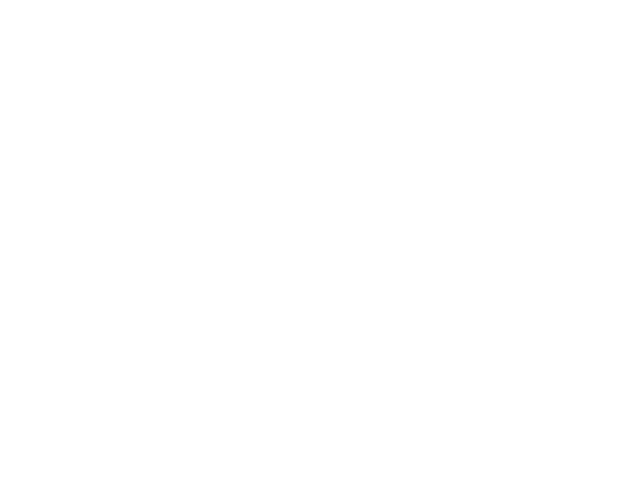

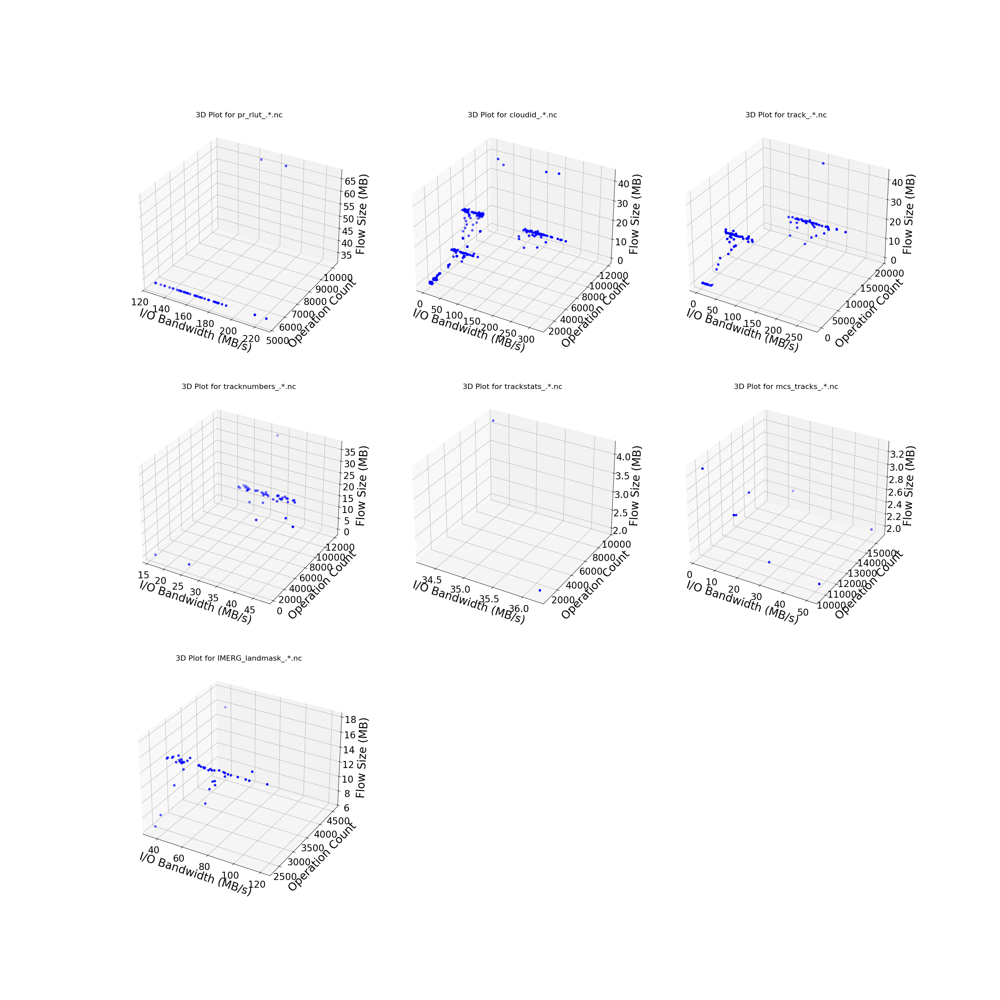

In [511]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

# Generate a color palette
unique_filegroup = df['file_group'].unique()
num_filegroups = len(unique_filegroup)

# Set the font sizes for various plot elements
plt.rc('font', size=18)             # Default text size
plt.rc('axes', titlesize=16)        # Axes title font size
plt.rc('axes', labelsize=24)        # Axes label font size
plt.rc('xtick', labelsize=20)       # X-tick label font size
plt.rc('ytick', labelsize=20)       # Y-tick label font size
plt.rc('legend', fontsize=16)       # Legend font size

# Determine the grid layout based on the number of unique file groups
num_cols = min(3, num_filegroups)  # Max 3 columns per row
num_rows = int(np.ceil(num_filegroups / num_cols))  # Calculate required rows

# Create a figure and define the GridSpec
fig = plt.figure(figsize=(num_cols * 10, num_rows * 10))
gs = gridspec.GridSpec(num_rows, num_cols)

# Generate grid positions dynamically
task_indices = [(i // num_cols, i % num_cols) for i in range(num_filegroups)]

for i, (file, (row, col)) in enumerate(zip(unique_filegroup, task_indices)):
    subset = df[df['file_group'] == file]
    ax = fig.add_subplot(gs[row, col], projection='3d')
    ax.scatter(subset['trMiB'], subset['opCount'], subset['aggregateFilesizeMB'], 
               label=file, 
               color='b')
    ax.set_title(f'3D Plot for {file}')
    ax.set_xlabel('I/O Bandwidth (MB/s)', labelpad=10)
    ax.set_ylabel('Operation Count', labelpad=13)
    ax.set_zlabel('Flow Size (MB)', labelpad=10)

plt.figure(constrained_layout=True)
plt.subplots_adjust(hspace=0.4, wspace=0.4) 
plt.show()
fig.savefig(f'{result_path}/filegroup_subplot_op_' + plot_file_name)

/tmp/ipykernel_38332/4260203375.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(hspace=0.4, wspace=0.4)


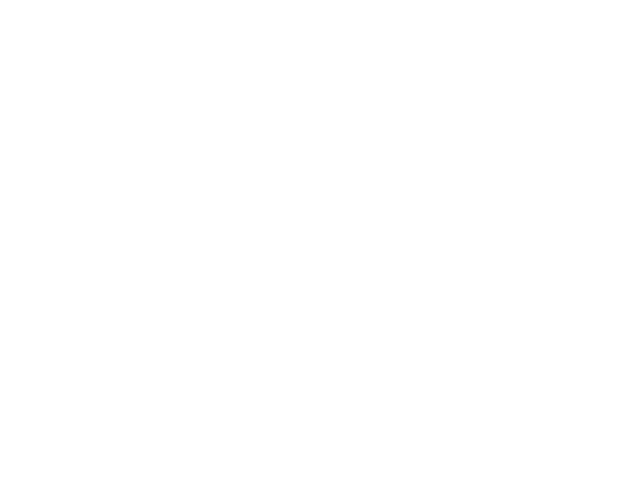

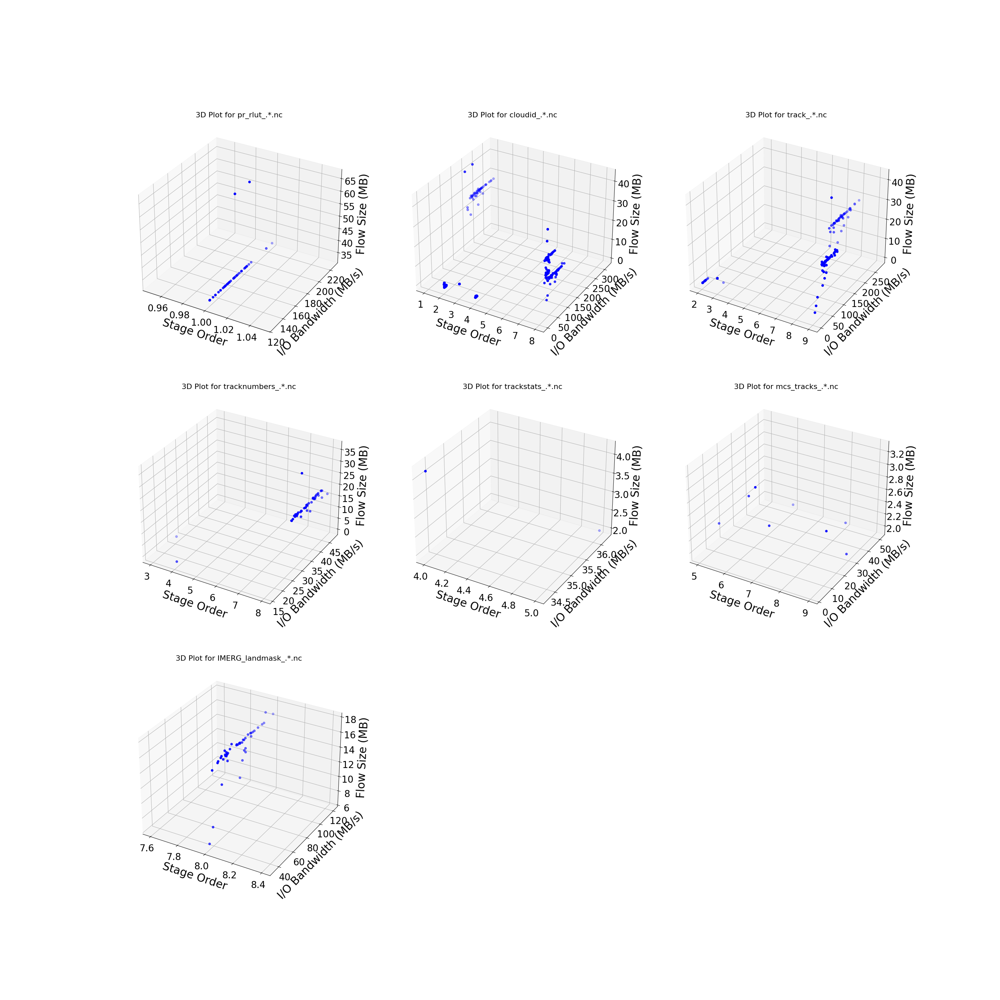

In [512]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np


# Generate a color palette
unique_filegroup = df['file_group'].unique()
num_filegroups = len(unique_filegroup)

# Set the font sizes for various plot elements
plt.rc('font', size=18)             # Default text size
plt.rc('axes', titlesize=16)        # Axes title font size
plt.rc('axes', labelsize=24)        # Axes label font size
plt.rc('xtick', labelsize=20)       # X-tick label font size
plt.rc('ytick', labelsize=20)       # Y-tick label font size
plt.rc('legend', fontsize=16)       # Legend font size

# Determine the grid layout based on the number of unique file groups
num_cols = min(3, num_filegroups)  # Max 3 columns per row
num_rows = int(np.ceil(num_filegroups / num_cols))  # Calculate required rows

# Create a figure and define the GridSpec
fig = plt.figure(figsize=(num_cols * 10, num_rows * 10))
gs = gridspec.GridSpec(num_rows, num_cols)

# Generate grid positions dynamically
task_indices = [(i // num_cols, i % num_cols) for i in range(num_filegroups)]

for i, (file, (row, col)) in enumerate(zip(unique_filegroup, task_indices)):
    subset = df[df['file_group'] == file]
    ax = fig.add_subplot(gs[row, col], projection='3d')
    ax.scatter(subset['stageOrder'], subset['trMiB'], subset['aggregateFilesizeMB'], 
               label=file, 
               color='b')
    ax.set_title(f'3D Plot for {file}')
    ax.set_ylabel('I/O Bandwidth (MB/s)', labelpad=10)
    ax.set_xlabel('Stage Order', labelpad=13)
    ax.set_zlabel('Flow Size (MB)', labelpad=10)

plt.figure(constrained_layout=True)
plt.subplots_adjust(hspace=0.4, wspace=0.4) 
plt.show()
fig.savefig(f'{result_path}/filegroup_subplot_stage_' + plot_file_name)

In [ ]:
df.columns, df['stageOrder'].unique()

(Index(['operation', 'randomOffset', 'transferSize', 'aggregateFilesizeMB',
        'numTasks', 'parallelism', 'totalTime', 'numNodesList', 'numNodes',
        'tasksPerNode', 'trMiB', 'storageType', 'opCount', 'taskName',
        'taskPID', 'fileName', 'stageOrder', 'prevTask',
        'estimated_trMiB_ssd_p', 'estimated_trMiB_beegfs_p',
        'estimated_trMiB_ssd_1p', 'estimated_ts_slope_ssd_1p',
        'estimated_trMiB_ssd_12p', 'estimated_ts_slope_ssd_12p',
        'estimated_trMiB_beegfs_1p', 'estimated_ts_slope_beegfs_1p',
        'estimated_trMiB_beegfs_12p', 'estimated_ts_slope_beegfs_12p',
        'io_type', 'color', 'marker', 'file_group'],
       dtype='object'),
 array([1, 2, 3, 4, 5, 6, 7, 8, 9]))

: 